# Importing required libraries

We require numpy for maths, scipy to load data and to find the eigen vectors, matplotlib for the plots etc. So we import all these libraries as shown below.

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy.io import loadmat
import scipy

# Extracting Data

From the given train and test datasets, using loadmat function from scipy library we extract the required data. From the training dataset, we have train labels and train data, train labels contains all the labels to the images present in the train data, similarly from the test dataset, we have test labels and test data, test labels contains all the labels to the images present in the test data.

Therefore, train labels is a (320 * 1) numpy array and train data is a (320 * 10304) numpy array (since each image is of shape 112 * 92 flattened into a vector of length 10304). Similarly, test labels is a (80 * 1) numpy array and test data is a (80 * 10304) numpy array.

In [2]:
train_labels = loadmat('/content/drive/My Drive/train_set.mat')['labels']
train_data = loadmat('/content/drive/My Drive/train_set.mat')['data']
test_labels = loadmat('/content/drive/My Drive/test_set.mat')['labels']
test_data = loadmat('/content/drive/My Drive/test_set.mat')['data']
print(train_labels.shape)
print(train_data.shape)
print(test_labels.shape)
print(test_data.shape)

(1, 320)
(320, 10304)
(1, 80)
(80, 10304)


# Visualilization

We need to visualize one image for each label/identity in the training and test set. We can choose any one image for each label. Since the images have been flattened, we need to reshape them into a 112×92 shaped matrix before displaying. We need to display them in a 5×8 grid of subplots. For displaying images, we have used the Matplotlib function imshow() in Python. 

Firstly we have divided our plot into 5 rows and 8 columns to accomodate 40 images, each corresponding to each label. Now for each unique label in the train labels and test labels, we use imshow() function in python to show the specific image at specific position as shown below. 

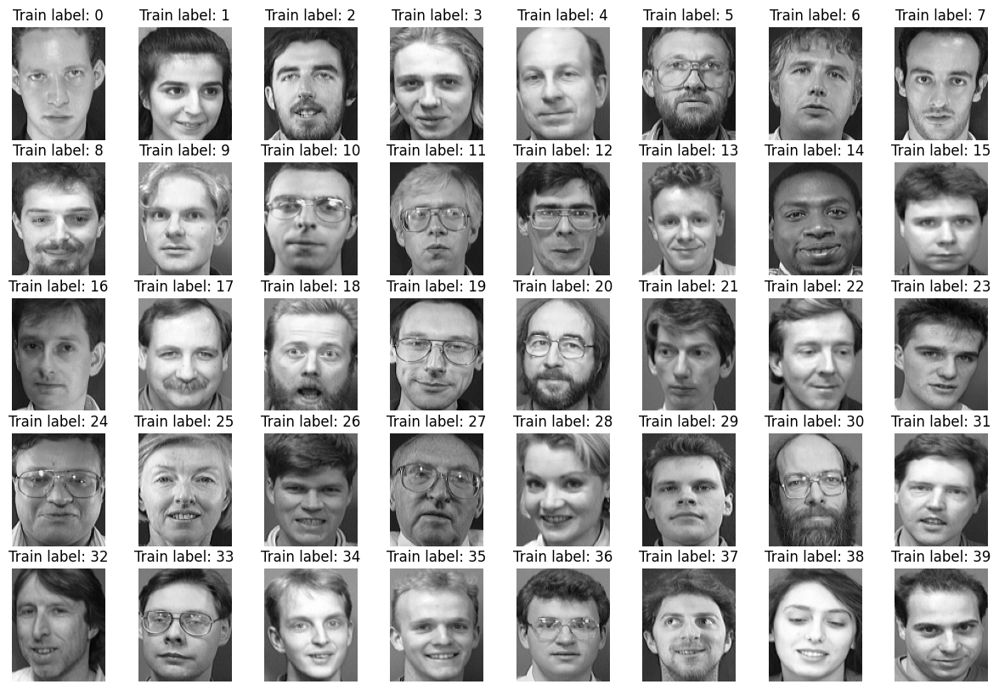

In [3]:
# Create a 5x8 grid of subplots
fig, axes = plt.subplots(nrows=5, ncols=8, figsize=(15,10))

# Loop over the unique labels and plot one image for each label
for i in (np.unique(train_labels)):
    # Reshape the image and plot it in the current subplot
    axes[i//8, i%8].imshow(train_data[i*8].reshape(112, 92), cmap='gray')
    axes[i//8, i%8].set_title(f"Train label: {i}")
    axes[i//8, i%8].axis('off')
  
plt.show()

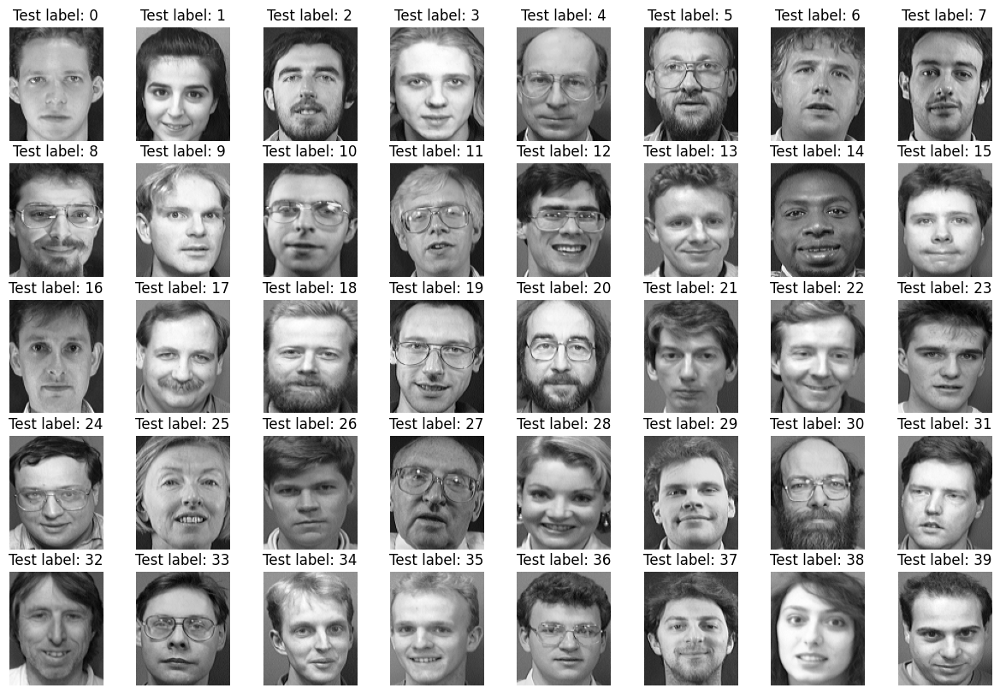

In [4]:
# Create a 5x8 grid of subplots
fig, axes = plt.subplots(nrows=5, ncols=8, figsize=(15,10))

# Loop over the unique labels and plot one image for each label
for i in (np.unique(test_labels)):
    # Reshape the image and plot it in the current subplot
    axes[(i)//8, (i)%8].imshow(test_data[i*2].reshape(112, 92), cmap='gray')
    axes[(i)//8, (i)%8].set_title(f"Test label: {i}")
    axes[(i)//8, (i)%8].axis('off')
  
plt.show()

# Pre-processing

We find the mean image for the training set, then subtract it from the train data and test data to make them centered train data and centered test data respectively.
To find the mean image we have used the mean function from the numpy library as shown below and visualized it using the imshow() function.

[85.675    85.63125  85.953125 ... 77.965625 76.784375 76.05625 ]


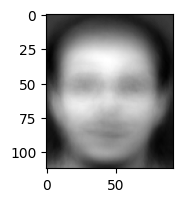

In [5]:
mean_train = np.mean(train_data,axis=0)
print(mean_train)
plt.figure(figsize = (3,2))
plt.imshow(mean_train.reshape(112,92), cmap='gray')

# Visualizing centered train data and centered test data


From the train data and test data the mean image is subtracted to form the centered train data and the centered test data. In the same way as mentioned above to visualise the train data and test data, we also visualise the centered train data and centered test data, that is, form a subplot grid of 5 * 8 to accomodate 40 images, then for each unique label we visualize the image using the imshow() function.

(320, 10304)


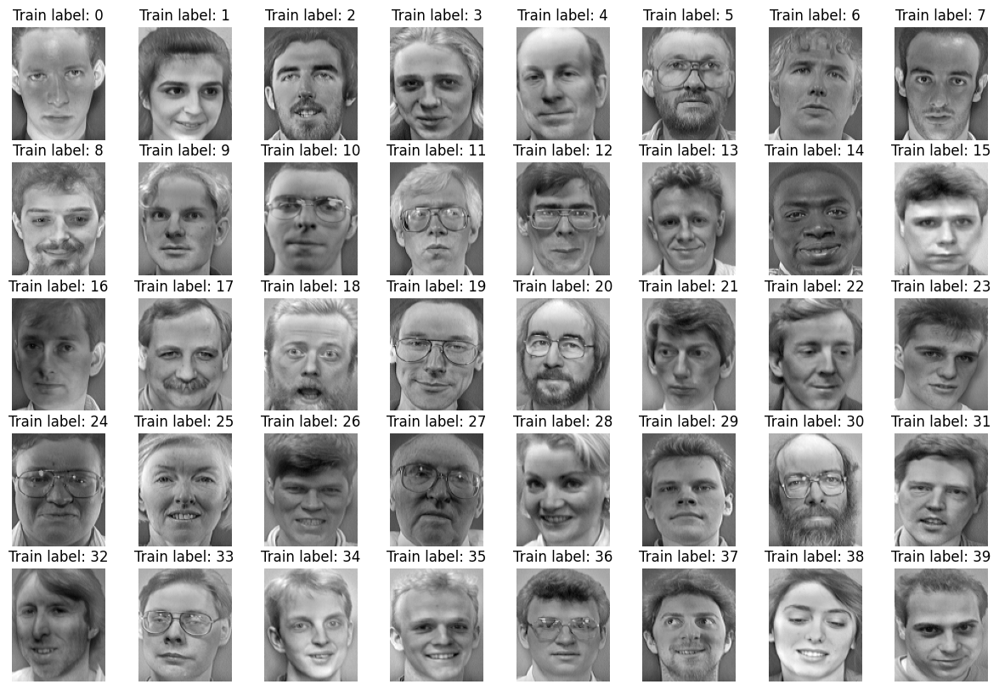

In [6]:
centered_train = train_data-mean_train
print(centered_train.shape)

fig, axes = plt.subplots(nrows=5, ncols=8, figsize=(15,10))

for i in (np.unique(train_labels)):
    # Reshape the image and plot it in the current subplot
    axes[(i)//8, (i)%8].imshow(centered_train[i*8].reshape(112, 92), cmap='gray')
    axes[(i)//8, (i)%8].set_title(f"Train label: {i}")
    axes[(i)//8, (i)%8].axis('off')

plt.show()

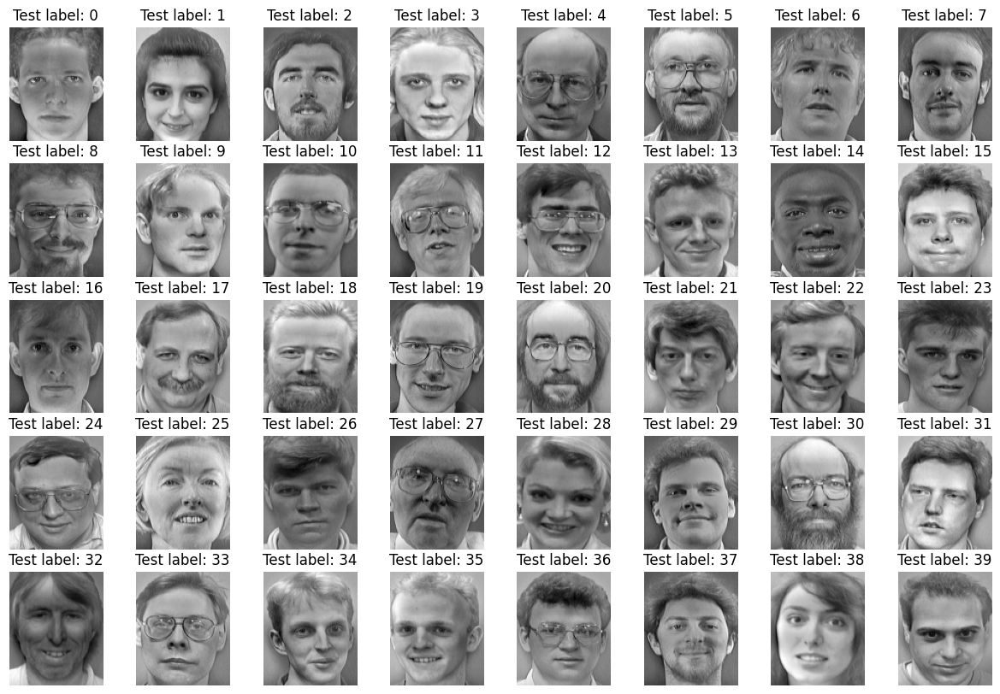

In [7]:
centered_test = test_data-mean_train

fig, axes = plt.subplots(nrows=5, ncols=8, figsize=(15,10))

for i in (np.unique(test_labels)):
    # Reshape the image and plot it in the current subplot
    axes[(i)//8, (i)%8].imshow(centered_test[i*2].reshape(112, 92), cmap='gray')
    axes[(i)//8, (i)%8].set_title(f"Test label: {i}")
    axes[(i)//8, (i)%8].axis('off')

plt.show()

# Finding Eigenfaces

The actual covariance matrix is (1/N)*($X^TX$). But here the $X^TX$ matrix is (10304 * 10304) matrix, finding eigenvalues and eigenvectors for this matrix takes a lot of time. So instead we find the eigen vectors and eigen values for the ($XX^T$) matrix which is (320 * 320) matrix. The eigenvalues for both ($XX^T$) and ($X^TX$) are the same. The eigenvectors of ($X^TX$) are ($X^T$) multiplied with the eigenvectors of ($XX^T$).

So initially we compute ($XX^T$) then find its eigenvalues and eigenvectors, then multiplying by ($X^T$) we find the eigenvalues and eigenvectors of the required covariance matrix as shown below. We use the .eigh function to find the eigenvalues it returns the matrix where eigenvectors are arranged column wise in ascending order.

In [8]:
cov_train = (1/320)*(np.dot(centered_train,centered_train.T))
eig_val, eig_vec_t = scipy.linalg.eigh(cov_train)
eig_vec = np.dot((centered_train.T),eig_vec_t)
print(eig_vec)

[[ 2.91322522e-13  7.32146771e-01 -1.53185376e+00 ... -3.39370555e+02
   3.80386563e+02  3.99732304e+01]
 [ 1.27897692e-13 -3.58587222e+00  8.67324008e-01 ... -3.40839060e+02
   3.76533922e+02  3.97925742e+01]
 [ 5.68434189e-14 -1.95221179e+00  2.07798537e+00 ... -3.37180062e+02
   3.77402165e+02  4.14544557e+01]
 ...
 [ 1.70530257e-13  5.05978619e+00 -3.06634967e+00 ... -3.01941358e+02
  -2.55218573e+02  2.24141993e+02]
 [ 4.97379915e-13  1.01170921e+01 -1.42956529e+00 ... -3.10833837e+02
  -2.35939870e+02  1.90131370e+02]
 [ 9.37916411e-13  1.23420270e+01 -8.49887163e+00 ... -3.16852404e+02
  -2.13416933e+02  2.15733053e+02]]


# Visualising the first 25 Eigenfaces

Now each eigenvector is a 10304 length vector. Now the eig_vec matrix consists of 320 such eigenvectors arranged columnwise. To visualise the top 25 eigenfaces we use the last 25 columns of the eig_vec matrix since they are arranged in ascending order. Then in order to visualise we reshape them into original form (112 * 92) and then use the imshow() function to display them as shown below.

(10304,)


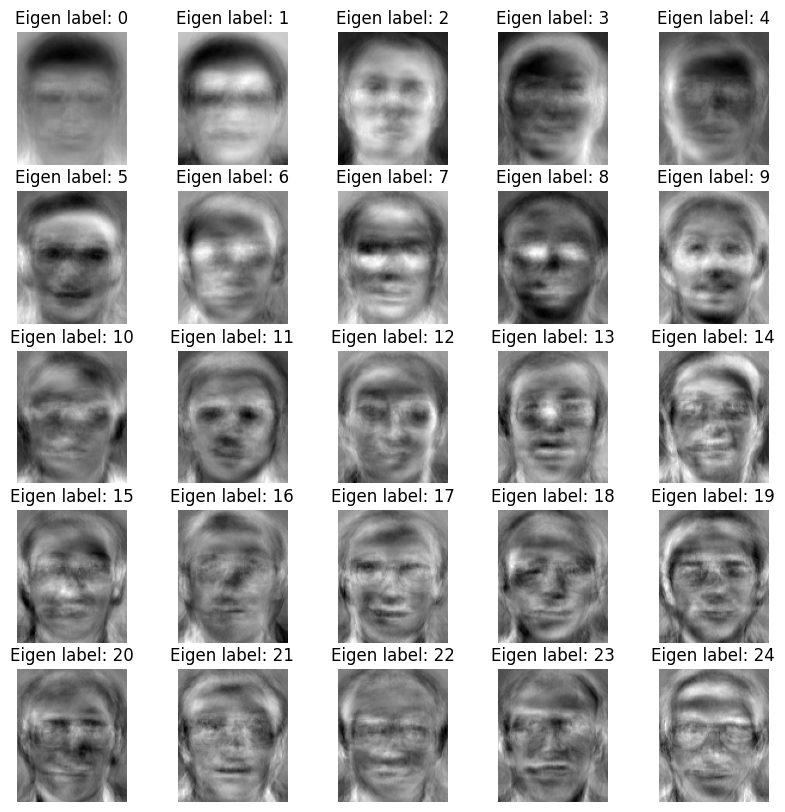

In [9]:
print(eig_vec[:,0].shape)
fig, axes = plt.subplots(nrows=5, ncols=5, figsize=(10,10))

for i in range(25):
  axes[(i)//5, (i)%5].imshow((eig_vec[:,319-i].T).reshape(112, 92), cmap='gray')
  axes[(i)//5, (i)%5].set_title(f"Eigen label: {i}")
  axes[(i)//5, (i)%5].axis('off')
  
plt.show()

# Plotting the variance along each principal component

The variance along eac principal component is the eigenvalue representing the eigenvector. So we have flipped the eig_val vector so that the eigen values which initially were in asceding order will be sorted in the descending irder, then used the matplotlib library to plot the variance along each pricipal component.

(320, 1)


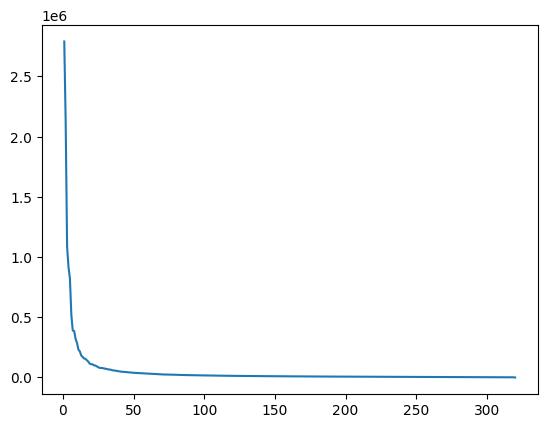

In [10]:
x = np.linspace(1,320,320).reshape(-1,1)
print(x.shape)
plt.plot(x,np.flip(eig_val.reshape(-1,1)))
plt.show()

# Finding k and d

Here, d is the maximum number of principal components.Therefore d is equal to 320 here. k is the minimum number of pricipal components required such that the sum of variance along these components is greater than or equal to the 95% of the total variance along all pricipal components. Using the basic code below we find the value of k, we remove smallest eigen values until the variance along remaining components is still >=95% of total variance. Here k is equal to 164. Therefore the values of d and k are 320 and 164 respectively.

In [11]:
sum_var = np.sum(eig_val)
print(sum_var)
k = 0
while(sum_var>=0.95*np.sum(eig_val)):
  sum_var -= eig_val[k]
  k += 1
k = 321-k
print(k)

16005088.933164058
164


# K-dimensional representation

Using the ‘k’ obtained in the previous task, we find the k-dimensional representation along the principal components for each train and test sample. If $x_i$ is a column vector representing a single centered data point and $v_j$ for j = 1 to k are the top-k eigenvectors of the data covariance matrix, then the k-dimensional representation for $x_i$
is $z_i = (x_i^Tv_1,x_i^Tv_2,x_i^Tv_3,...,x_i^Tv_k)$. 

Firstly, we will reverse the eig_vec matrix so that our eigenvectors are arranged in descending order then take the top k of them that is 164 of them. Then obtain the k dimensional representation using the above formula and implementing as shown below. Now centered_train_pca and centered_test_pca are the representation of train and test data in k dimensional space.


In [12]:
eig_vec_pca = np.fliplr(eig_vec)[:, :k]
print(eig_vec_pca.shape)
centered_train_pca = np.dot(centered_train,eig_vec_pca)
print(centered_train_pca.shape)
centered_test_pca = np.dot(centered_test,eig_vec_pca)
print(centered_test_pca.shape)

(10304, 164)
(320, 164)
(80, 164)


# Face Recognition
Using the above low-dimensional representation, for each test sample, we find the sample in the train set that is closest to it in the k-dimensional subspace. If $z_T$ is the k-dimensional representation of
a centered test sample $x_T$ , and $z_i$ is the k-dimensional representation of the i − th centered train sample $x_i$, then $x_i$ is the train sample closest to $x_T$ in the k-dimensional space if $||z_i−z_T||^2$ is the minimum across all train samples. We will display the test sample ($x_T$) and its closest train sample ($x_i$). 

We took an empty list, then appeneded a tuple of test label and the closest train label found using the above described process and also displayed the test sample and the closesgt train sample corresponding to the test sample using the imshow() function. So after the implementation of the below code, we will have a list "test_closest_train_label" that conatins tuples of test label and the corresponding closest train label, and also the images of the test samples along side with the closest train sample are displayed.


<ipython-input-13-883ad3c8cc42>:8: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, axes = plt.subplots(1,2)


[(0, 7), (0, 0), (1, 1), (1, 1), (2, 2), (2, 2), (3, 3), (3, 3), (4, 4), (4, 4), (5, 5), (5, 5), (6, 6), (6, 6), (7, 7), (7, 7), (8, 8), (8, 8), (9, 9), (9, 9), (10, 10), (10, 10), (11, 11), (11, 11), (12, 12), (12, 12), (13, 13), (13, 13), (14, 14), (14, 14), (15, 15), (15, 15), (16, 16), (16, 16), (17, 17), (17, 17), (18, 18), (18, 18), (19, 19), (19, 19), (20, 20), (20, 20), (21, 21), (21, 21), (22, 22), (22, 22), (23, 23), (23, 23), (24, 24), (24, 24), (25, 25), (25, 25), (26, 26), (26, 26), (27, 27), (27, 27), (28, 6), (28, 28), (29, 29), (29, 8), (30, 30), (30, 30), (31, 31), (31, 31), (32, 14), (32, 32), (33, 33), (33, 33), (34, 34), (34, 34), (35, 35), (35, 35), (36, 36), (36, 36), (37, 37), (37, 37), (38, 38), (38, 38), (39, 39), (39, 39)]


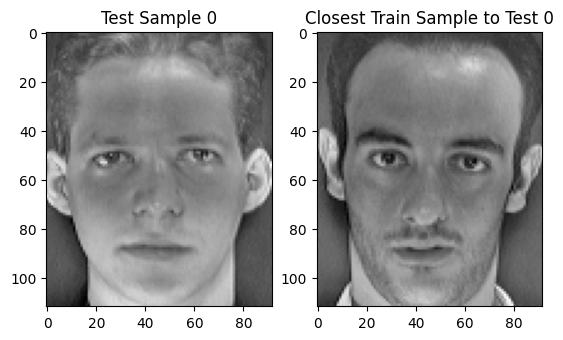

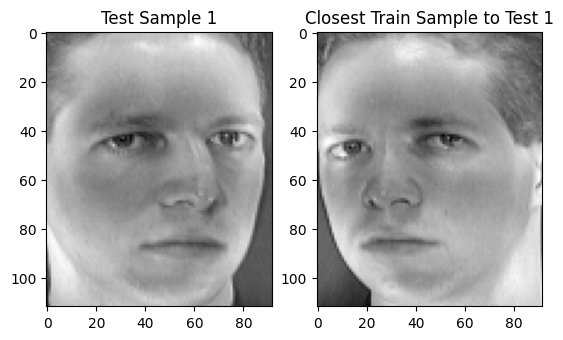

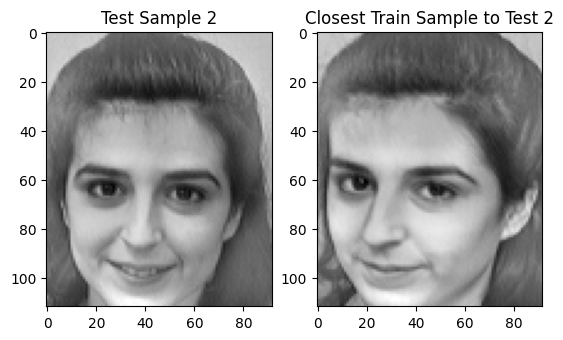

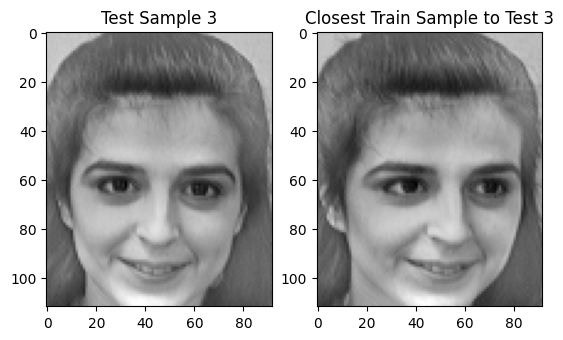

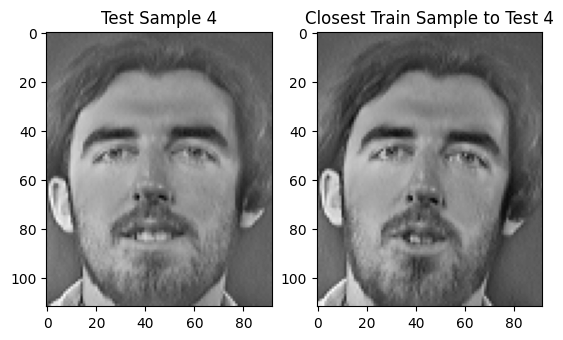

...

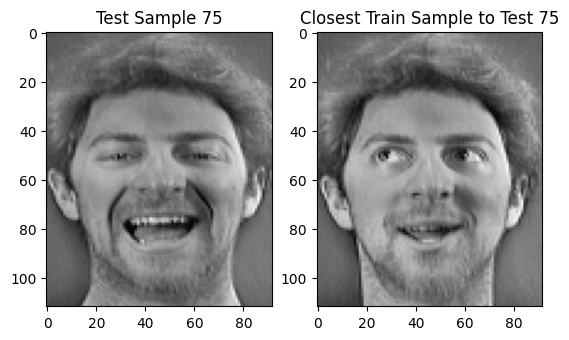

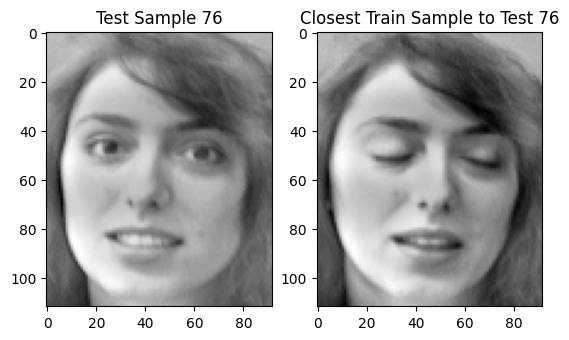

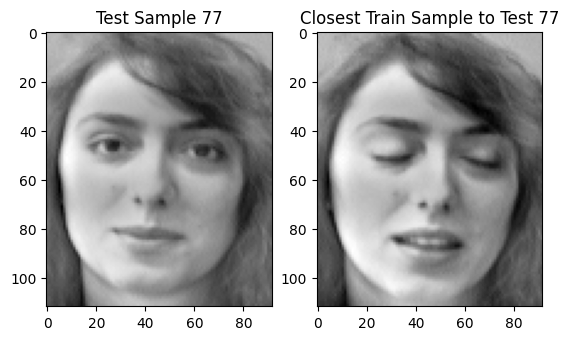

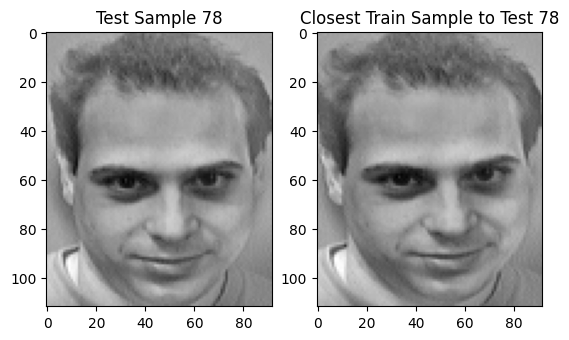

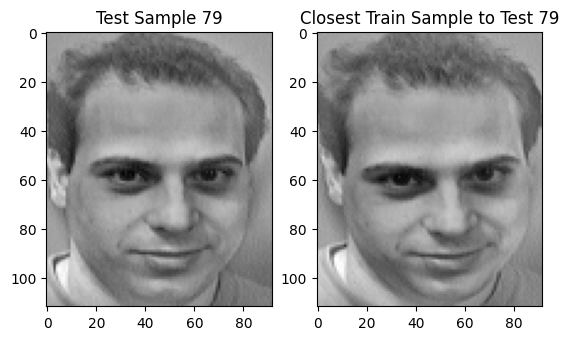

In [13]:
test_closest_train_labels = []
for i in range(centered_test.shape[0]):
  norm = np.sum((centered_train_pca-centered_test_pca[i])**2,axis=1)
  test_closest_train_labels.append((test_labels[0][i],(train_labels[0][np.argmin(norm)])))
  test_sample = centered_test[i].reshape(112,92)
  closest_train_sample = centered_train[np.argmin(norm)].reshape(112,92)

  fig, axes = plt.subplots(1,2)
  axes[0].imshow(test_sample.real, cmap='gray')
  axes[0].set_title(f'Test Sample {i}')
  axes[1].imshow(closest_train_sample.real, cmap='gray')
  axes[1].set_title(f'Closest Train Sample to Test {i}')
print(test_closest_train_labels)


# Accuracy

The accuracy is found by the ratio of the number of test labels matched with the closest train labels to the total number of test labels multiplied with 100. 

In [14]:
accuracy = (sum(1 for x in test_closest_train_labels if x[0]==x[1]))/(len(test_closest_train_labels))*100
print(accuracy)

95.0


 Here we found the accuracy to be 95%. The accuracy value doesn't change on the variation of k.